# Shopper Intentions 

For marketing teams in a major online retailer, it is paramount to discover what drives customers from the first step of entering your site to checking out and completing sales. Every sale counts, and deducing the factors that most strongly affect whether a customer buys or leaves helps the web development team format the site to maintain interest, as well as marketing teams to target customer segments with higher probability and frequency of purchases. 

Here the shopping intentions (Under the Revenue column) have been labelled True/False to indicate whether the customer purchased anything from the site. By generating and comparing multiple machine learning models to predict intentions, we can compare and contrast models to answer a few key questions:

What factors are most correlated with purchases?

How well can each model predict unseen observations?

Which model produces the most actionable results?

"Administrative", "Administrative Duration", "Informational", "Informational Duration", "Product Related" and "Product Related Duration" represent the number of different types of pages visited by the visitor in that session and total time spent in each of these page categories. The values of these features are derived from the URL information of the pages visited by the user and updated in real time when a user takes an action, e.g. moving from one page to another.

This dataset was provided by the UCI machine learning repository. Link Below:
Sakar, C.O., Polat, S.O., Katircioglu, M. et al. Neural Comput & Applic (2018). Link: https://archive.ics.uci.edu/ml/datasets/Online+Shoppers+Purchasing+Intention+Dataset#

In [141]:
#Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import normaltest
from scipy.stats import boxcox 
from scipy.stats import ttest_ind
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
%matplotlib inline

In [142]:
shoppers=pd.read_csv('online_shoppers_intention.csv')
shoppers.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [143]:
shoppers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
Administrative             12330 non-null int64
Administrative_Duration    12330 non-null float64
Informational              12330 non-null int64
Informational_Duration     12330 non-null float64
ProductRelated             12330 non-null int64
ProductRelated_Duration    12330 non-null float64
BounceRates                12330 non-null float64
ExitRates                  12330 non-null float64
PageValues                 12330 non-null float64
SpecialDay                 12330 non-null float64
Month                      12330 non-null object
OperatingSystems           12330 non-null int64
Browser                    12330 non-null int64
Region                     12330 non-null int64
TrafficType                12330 non-null int64
VisitorType                12330 non-null object
Weekend                    12330 non-null bool
Revenue                    12330 non-null bool
dtypes: bool(

In [4]:
#No missing values, address outliers
shoppers.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
count,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.315166,80.818611,0.503569,34.472398,31.731468,1194.746220,0.022191,0.043073,5.889258,0.061427,2.124006,2.357097,3.147364,4.069586
std,3.321784,176.779107,1.270156,140.749294,44.475503,1913.669288,0.048488,0.048597,18.568437,0.198917,0.911325,1.717277,2.401591,4.025169
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,184.137500,0.000000,0.014286,0.000000,0.000000,2.000000,2.000000,1.000000,2.000000
50%,1.000000,7.500000,0.000000,0.000000,18.000000,598.936905,0.003112,0.025156,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1464.157213,0.016813,0.050000,0.000000,0.000000,3.000000,2.000000,4.000000,4.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,8.000000,13.000000,9.000000,20.000000


In [144]:
#Isolate test data
shoppers, shop_test= train_test_split(shoppers, test_size=0.10)

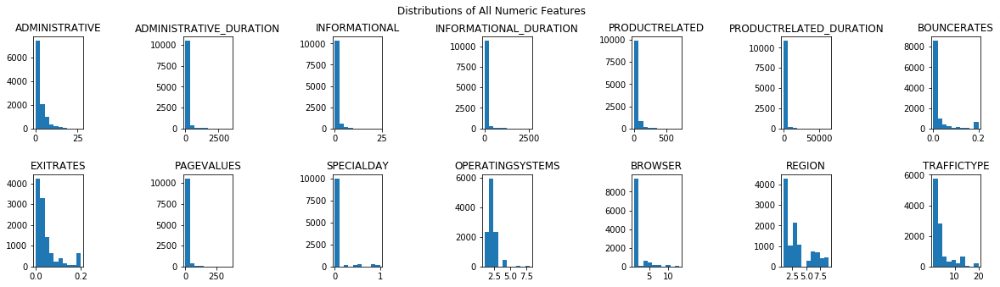

In [6]:
#Isolate numeric columns
numeric=shoppers.select_dtypes(include=['float64', 'int64'])
fig, axes=plt.subplots(nrows=2, ncols=7, figsize=(20, 5))
fig.suptitle('Distributions of All Numeric Features')
fig.subplots_adjust(hspace=0.5, wspace=2.0)
for ax, feature, name in zip(axes.flatten(), numeric, numeric.columns):
    ax.hist(numeric[feature])
    ax.set(title=name.upper())

In [7]:
#Power transform data to reduce outliers/normalize distributions
#Keep an untransformed copy
shoppers2=shoppers.copy()
for col in numeric: 
    numeric.loc[:, col], _=boxcox(numeric.loc[:, col]+1)

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/pandas/core/indexing.py:480: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [8]:
#Tukey's Range test identifies outliers 
outliers=[]
for col in numeric:
    Q1=np.percentile(shoppers[col], 25)
    Q3=np.percentile(shoppers[col], 75)
    IQR=Q3-Q1
    step=IQR*5
    print('Outliers for column {}:'.format(col))
    print(pd.DataFrame(shoppers[(shoppers[col]< Q1-step) |
         (shoppers[col]> Q3+step)]))
    extremes=shoppers[(shoppers[col]< Q1-step) |
         (shoppers[col]> Q3+step)].index.tolist()
    #Append all to list 
    outliers.append(extremes)

Outliers for column Administrative:
       Administrative  Administrative_Duration  Informational  \
8308               27               853.735949              2   
12178              26              1561.717567              9   

       Informational_Duration  ProductRelated  ProductRelated_Duration  \
8308               126.500000             584              24844.15620   
12178              503.722222             183               9676.09318   

       BounceRates  ExitRates  PageValues  SpecialDay Month  OperatingSystems  \
8308      0.002099   0.009347    4.511100         0.0   Nov                 2   
12178     0.011055   0.014200   19.567464         0.0   Nov                 3   

       Browser  Region  TrafficType        VisitorType  Weekend  Revenue  
8308         4       3            8  Returning_Visitor    False    False  
12178        2       2           13  Returning_Visitor    False     True  
Outliers for column Administrative_Duration:
       Administrative  Administ

In [9]:
for i, feat in enumerate(outliers):
    print('Outliers >5 steps away from IQR in column {}: {}'.format(shoppers.columns[i], len(feat)))

Outliers >5 steps away from IQR in column Administrative: 2
Outliers >5 steps away from IQR in column Administrative_Duration: 248
Outliers >5 steps away from IQR in column Informational: 2346
Outliers >5 steps away from IQR in column Informational_Duration: 2149
Outliers >5 steps away from IQR in column ProductRelated: 148
Outliers >5 steps away from IQR in column ProductRelated_Duration: 148
Outliers >5 steps away from IQR in column BounceRates: 732
Outliers >5 steps away from IQR in column ExitRates: 0
Outliers >5 steps away from IQR in column PageValues: 2468
Outliers >5 steps away from IQR in column SpecialDay: 1122
Outliers >5 steps away from IQR in column Month: 0
Outliers >5 steps away from IQR in column OperatingSystems: 3937
Outliers >5 steps away from IQR in column Browser: 0
Outliers >5 steps away from IQR in column Region: 235


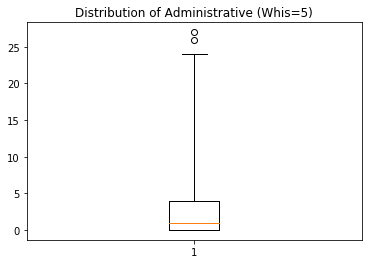

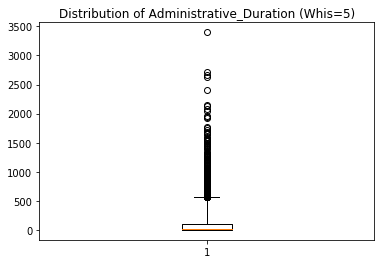

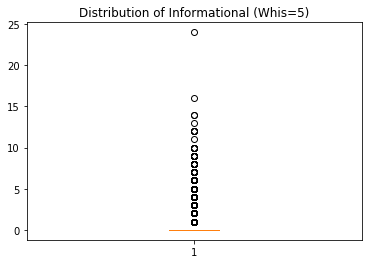

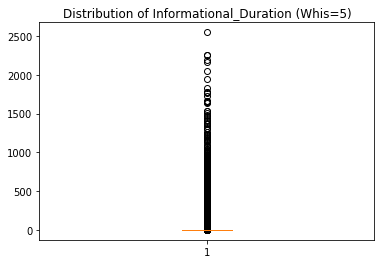

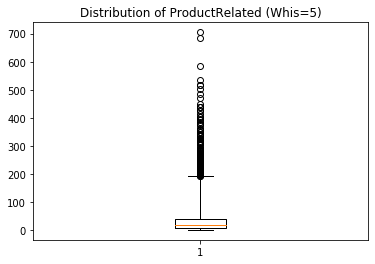

...

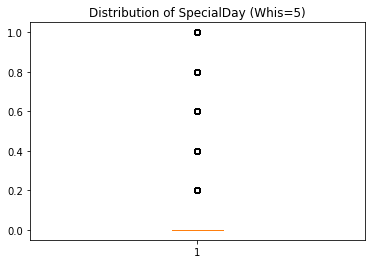

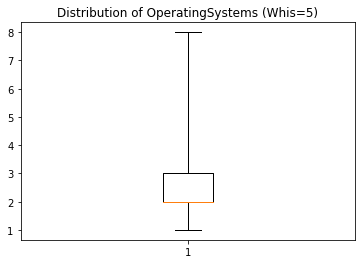

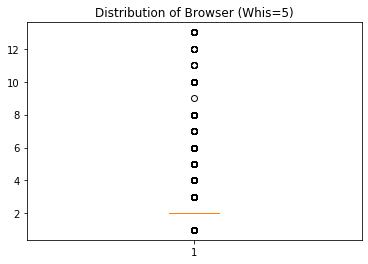

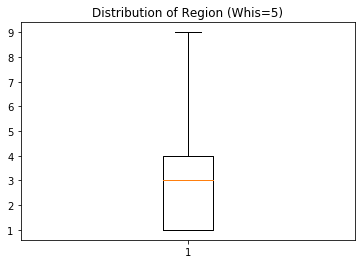

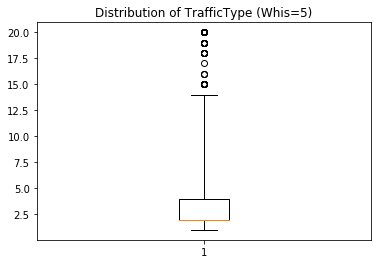

In [10]:
#Draw boxplots to identify Outliers
for i, col in enumerate(numeric):
    plt.figure(i)
    plt.title('Distribution of {} (Whis=5)'.format(col))
    plt.boxplot(shoppers[col], whis=5)

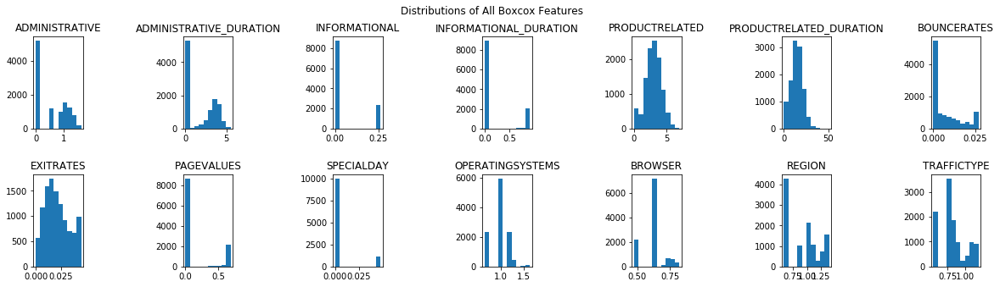

In [11]:
#Plot transformed distributions
fig, axes=plt.subplots(nrows=2, ncols=7, figsize=(20, 5))
fig.suptitle('Distributions of All Boxcox Features')
fig.subplots_adjust(hspace=0.5, wspace=2.0)
for ax, feature, name in zip(axes.flatten(), numeric, numeric.columns):
    ax.hist(numeric[feature])
    ax.set(title=name.upper())

Some of the distributions are starting to appear more normal-running a normaltest will provide a more formal determination.

In [12]:
#Check normalcy of distributions
#Append all non-normal distributions to list for further preprocessing
notnormal=[]
for col in numeric:
    print('\nResults of Normalcy Test for {} Column:'.format(col))
    print(normaltest(numeric[col]))
    if normaltest(numeric[col]).pvalue==0:
        notnormal.append(col)


Results of Normalcy Test for Administrative Column:
NormaltestResult(statistic=55400.62276921061, pvalue=0.0)

Results of Normalcy Test for Administrative_Duration Column:
NormaltestResult(statistic=45897.63596347194, pvalue=0.0)

Results of Normalcy Test for Informational Column:
NormaltestResult(statistic=2150.796262374586, pvalue=0.0)

Results of Normalcy Test for Informational_Duration Column:
NormaltestResult(statistic=2485.9765246925067, pvalue=0.0)

Results of Normalcy Test for ProductRelated Column:
NormaltestResult(statistic=80.54068001198918, pvalue=3.2420040349462667e-18)

Results of Normalcy Test for ProductRelated_Duration Column:
NormaltestResult(statistic=12.533605100282985, pvalue=0.001898288572318295)

Results of Normalcy Test for BounceRates Column:
NormaltestResult(statistic=1429.5163822174386, pvalue=3.8411538853156e-311)

Results of Normalcy Test for ExitRates Column:
NormaltestResult(statistic=1018.6512483957456, pvalue=6.348803987917466e-222)

Results of Normalc

6 of 14 features were succesfully coerced into normal distributions, which will improve model performance later on. 

As both models implement nonparametric methods, the models are robust to outliers, so winsorizing/removing outliers may not be entirely necessary in this instance. 

In [14]:
#T-tests to determine which variables have sig differences
bigdifference=[]
for col in numeric:
    print('\nT-Test Results for Column {}:'.format(col))
    print(ttest_ind(shoppers[shoppers['Revenue']==True][col],
                    shoppers[shoppers['Revenue']==False][col],
                    equal_var=False)
         )
    if ttest_ind(shoppers[shoppers['Revenue']==True][col],
                    shoppers[shoppers['Revenue']==False][col],
                 equal_var=False
                ).pvalue< 0.05:
        bigdifference.append(col)
print('\nColumns with Statistically Significant Differences:  \n')
print('\n'.join(bigdifference))


T-Test Results for Column Administrative:
Ttest_indResult(statistic=13.775317163902152, pvalue=1.8055083324025887e-41)

T-Test Results for Column Administrative_Duration:
Ttest_indResult(statistic=9.015884380441728, pvalue=4.1396726699372504e-19)

T-Test Results for Column Informational:
Ttest_indResult(statistic=8.629748875349389, pvalue=1.1758715200501446e-17)

T-Test Results for Column Informational_Duration:
Ttest_indResult(statistic=6.225504739044662, pvalue=5.771938694430946e-10)

T-Test Results for Column ProductRelated:
Ttest_indResult(statistic=13.081642427036645, pvalue=1.3088149708477173e-37)

T-Test Results for Column ProductRelated_Duration:
Ttest_indResult(statistic=13.540099430493784, pvalue=3.936784386423546e-40)

T-Test Results for Column BounceRates:
Ttest_indResult(statistic=-33.828370962899925, pvalue=1.4067526797320175e-238)

T-Test Results for Column ExitRates:
Ttest_indResult(statistic=-42.73822164342664, pvalue=0.0)

T-Test Results for Column PageValues:
Ttest_

8 of 14 columns held statistically significant differences between target groups, indicating most of our variables are providing strong signals in identifying whether shoppers spent money. 

In [45]:
#How many special days in each month?
shoppers.groupby('Month').sum()['SpecialDay']

Month
Aug      0.000000
Dec      0.000000
Feb      3.349007
Jul      0.000000
June     0.000000
Mar      0.000000
May     49.638615
Nov      0.000000
Oct      0.000000
Sep      0.000000
Name: SpecialDay, dtype: float64

Either Mother's Day or Memorial Day dominate the special day weights in May, while Valentine's day is the only other nonzero month. 

In [46]:
#Inspect group mean differences to identify potential high impact features
shoppers.groupby('Revenue').mean()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType,Is_Weekend,Total_Duration,Page_Visits
Revenue,,,,,,,,,,,,,,,,,
False,0.498824,1.709353,0.048111,0.153509,2.880263,13.753141,0.007913,0.022641,0.073777,0.005313,0.942397,0.611331,0.913921,0.822589,0.228169,14.981665,3.110909
True,0.757919,2.585296,0.080909,0.261205,3.532418,17.815013,0.003416,0.014279,0.539888,0.001840,0.933482,0.614614,0.903246,0.829154,0.260768,19.472502,3.836038


[[<matplotlib.axis.XTick at 0x11f23e550>,
 [Text(0, 0, 'True'), Text(0, 0, 'False')],
 Text(0.5, 1.0, 'Total Distribution of Revenue in Dataset')]

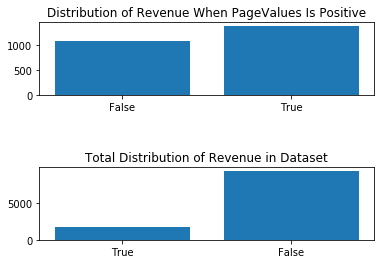

In [17]:
#PageValues exhibits largest ratio of difference b/w True/False Revenue groups
#Inspect ratio of Revenues when PageValues is a positive number
f, (ax1, ax2)=plt.subplots(2, 1)
f.subplots_adjust(hspace=1.0)
ax1.bar(shoppers.Revenue.unique(), shoppers[shoppers.PageValues !=0]['Revenue'].value_counts())
ax1.set(xticks=(0, 1), xticklabels=[False, True], title='Distribution of Revenue When PageValues Is Positive')
ax2.bar(shoppers.Revenue.unique(), shoppers.Revenue.value_counts())
ax2.set(xticks=(0, 1), xticklabels=[True, False], title='Total Distribution of Revenue in Dataset')


The status of Revenue is __13 TIMES__ more likely to be True when PageValues is any number above zero, so a dummy variable will be added in the feature engineering stage to capture this difference. 

In [18]:
#Make dummy to replace bool variable
shoppers['Is_Weekend']=np.where(shoppers.Weekend==True, 1, 0)
shoppers=shoppers.drop('Weekend', 1)

In [19]:
#Feature Engineering
shoppers['Total_Duration']=shoppers['Administrative_Duration'] \
+shoppers['Informational_Duration']+shoppers['ProductRelated_Duration']
shoppers['Total_Duration'], _=boxcox(shoppers['Total_Duration']+1)
shoppers['Page_Visits']=shoppers.Administrative+shoppers.Informational+shoppers.ProductRelated
shoppers['Page_Visits'], _=boxcox(shoppers['Page_Visits']+1)

Text(0.5, 1.0, 'Page Visits')

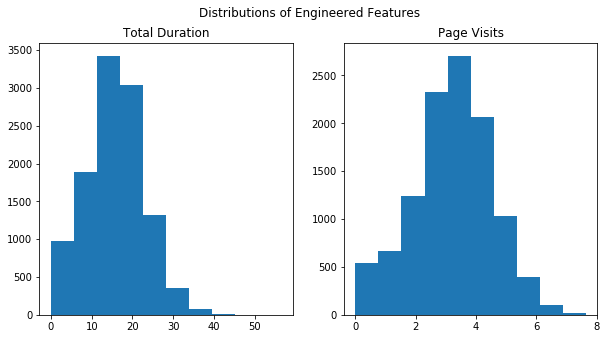

In [20]:
#Inspect Distributions of newly created Features
fig, (ax1, ax2)=plt.subplots(1, 2, figsize=(10, 5))
fig.suptitle('Distributions of Engineered Features')
ax1.hist(shoppers.Total_Duration)
ax1.set_title('Total Duration')
ax2.hist(shoppers.Page_Visits)
ax2.set_title('Page Visits')

In [21]:
#Test normality of distributions
print('Normal Test results for Total_Duration:{}\n'.format(normaltest(shoppers.Total_Duration)))
print('Normal Test results for Page Visits:{}'.format(normaltest(shoppers.Page_Visits)))

Normal Test results for Total_Duration:NormaltestResult(statistic=22.595169317027672, pvalue=1.2402845219181489e-05)

Normal Test results for Page Visits:NormaltestResult(statistic=56.20356279515916, pvalue=6.245272711149675e-13)


The engineered features exhibit normal distributions and may be safely piped into the algorithm. 

In [74]:
#Create features and target 
#Overwrite transformed numeric categories first
shoppers[numeric.columns]=numeric
X=shoppers.drop(['Revenue',], 1)
X=pd.get_dummies(X, drop_first=True)
X=MinMaxScaler().fit_transform(X)
Y=shoppers.Revenue

In [77]:
rfc=RandomForestClassifier(n_estimators=50)
rfc.fit(X, Y)
rfc.score(X, Y)

0.9996395422186176

In [78]:
y_pred=rfc.predict(X)
from sklearn.metrics import confusion_matrix
rfc_matrix= confusion_matrix(Y, y_pred)
print(rfc_matrix)
print('Classification Rate:{:.3f}'.format((rfc_matrix[0, 0]+rfc_matrix[1, 1])/X.shape[0]))
print('Recall Score for No Revenue:{:.3f}'.format(rfc_matrix[0, 0]/(rfc_matrix[0, 1]+ rfc_matrix[0, 0])))
print('Precision Score for No Revenue:{:.3f}'.format(rfc_matrix[0, 0]/(rfc_matrix[1, 0]+ rfc_matrix[0, 0])))
print('Recall Score for Positive Revenue:{:.3f}'.format(rfc_matrix[1, 1]/(rfc_matrix[1, 0]+ rfc_matrix[1, 1])))
print('Precision Score for Positive Revenue:{:.3f}'.format(rfc_matrix[1, 1]/(rfc_matrix[0, 1]+ rfc_matrix[1, 1])))

[[9379    0]
 [   4 1714]]
Classification Rate:1.000
Recall Score for No Revenue:1.000
Precision Score for No Revenue:1.000
Recall Score for Positive Revenue:0.998
Precision Score for Positive Revenue:1.000


The Random Forest model is highly accurate with predicting negative values, but suffers lower performance in predicting positive revenue when the value is actually positive.

In [79]:
#Tune Model
#First- findbest preliminary n_estimators
#Select random other parameters to initialize
params_1= {'n_estimators':range(10, 81, 10)}
gsearch1=GridSearchCV(RandomForestClassifier(
    min_samples_split=30,min_samples_leaf=10,
    max_depth=3,max_features='sqrt'),
                      param_grid=params_1, cv=5, n_jobs=-1)
gsearch1.fit(X, Y)
print(gsearch1.best_params_, gsearch1.best_score_)

{'n_estimators': 10} 0.8557267730017122


In [80]:
#Find best depth & min_samples_split
params_2= {'max_depth':range(2, 8), 'min_samples_split':range(10, 51, 10)}
gsearch2=GridSearchCV(RandomForestClassifier(
    n_estimators=gsearch1.best_params_['n_estimators'],
    min_samples_leaf=10,max_features='sqrt'),
                      param_grid=params_2, cv=5, n_jobs=-1, verbose=True)
gsearch2.fit(X, Y)
print(gsearch2.best_params_, gsearch2.best_score_)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  76 tasks      | elapsed:    3.2s


{'max_depth': 7, 'min_samples_split': 50} 0.9003334234477787


[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    6.3s finished


In [81]:
#Find best leaf and max_features
params_3= {'min_samples_leaf':range(1, 6), 'max_features':range(3, 10)}
gsearch3=GridSearchCV(RandomForestClassifier(
    n_estimators=gsearch1.best_params_['n_estimators'],
    max_depth=gsearch2.best_params_['max_depth'], 
    min_samples_split=gsearch2.best_params_['min_samples_split']),
    param_grid=params_3, cv=5, n_jobs=-1, verbose=True)
gsearch3.fit(X, Y)
print(gsearch3.best_params_, gsearch3.best_score_)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


Fitting 5 folds for each of 35 candidates, totalling 175 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    1.9s


{'max_features': 9, 'min_samples_leaf': 3} 0.9055600612778228


[Parallel(n_jobs=-1)]: Done 175 out of 175 | elapsed:    9.5s finished


In [82]:
rfc_tuned= RandomForestClassifier(
    n_estimators=gsearch1.best_params_['n_estimators'], 
    max_depth=gsearch2.best_params_['max_depth'], 
    min_samples_split=gsearch2.best_params_['min_samples_split'], 
    max_features=gsearch3.best_params_['max_features'], 
    min_samples_leaf=gsearch3.best_params_['min_samples_leaf'],
    oob_score=True, random_state=2744
)
rfc_tuned.fit(X, Y)
print('Tuned Model Training Set Score: {:.3f}'.format(rfc_tuned.score(X, Y)))
print('OOB Score: {:.3f}'.format(rfc_tuned.oob_score_))
print('Model Tuning Improvement:{:.3f}'.format(
    (cross_val_score(rfc_tuned, X, Y, cv=5).mean()-cross_val_score(rfc, X, Y, cv=5).mean())))

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


Tuned Model Training Set Score: 0.914
OOB Score: 0.898


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/ensemble/forest.py:460: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/ensemble/forest.py:465: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


Model Tuning Improvement:0.001


In [83]:
y_pred=rfc_tuned.predict(X)
from sklearn.metrics import confusion_matrix
rfc_tuned_matrix= confusion_matrix(Y, y_pred)
print(rfc_tuned_matrix)
print('Classification Rate:{:.3f}'.format((rfc_tuned_matrix[0, 0]+rfc_tuned_matrix[1, 1])/X.shape[0]))
print('Recall Score for No Revenue:{:.3f}'.format(rfc_tuned_matrix[0, 0]/(rfc_tuned_matrix[0, 1]+ rfc_tuned_matrix[0, 0])))
print('Precision Score for No Revenue:{:.3f}'.format(rfc_tuned_matrix[0, 0]/(rfc_tuned_matrix[1, 0]+ rfc_tuned_matrix[0, 0])))
print('Recall Score for Positive Revenue:{:.3f}'.format(rfc_tuned_matrix[1, 1]/(rfc_tuned_matrix[1, 0]+ rfc_tuned_matrix[1, 1])))
print('Precision Score for Positive Revenue:{:.3f}'.format(rfc_tuned_matrix[1, 1]/(rfc_tuned_matrix[0, 1]+ rfc_tuned_matrix[1, 1])))

[[9077  302]
 [ 651 1067]]
Classification Rate:0.914
Recall Score for No Revenue:0.968
Precision Score for No Revenue:0.933
Recall Score for Positive Revenue:0.621
Precision Score for Positive Revenue:0.779


In [92]:
#Naive test w/o transforming features
shop_test['Total_Duration']=shop_test['Administrative_Duration'] \
+shop_test['Informational_Duration']+shop_test['ProductRelated_Duration']
shop_test['Page_Visits']=shop_test.Administrative+shop_test.Informational+shop_test.ProductRelated
X_test=shop_test.drop(['Revenue'], 1)
X_test=pd.get_dummies(X_test, drop_first=True)
X_test_std=MinMaxScaler().fit_transform(X)
Y_test=shop_test.Revenue

([<matplotlib.axis.XTick at 0x12450e0d0>,
 <a list of 28 Text xticklabel objects>)

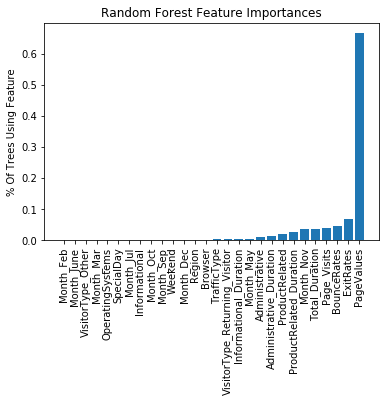

In [95]:
feats= rfc_tuned.feature_importances_
sorted_index=np.argsort(feats)
pos=np.arange(sorted_index.shape[0])
plt.bar(pos, feats[sorted_index])
plt.title('Random Forest Feature Importances')
plt.ylabel('% Of Trees Using Feature')
plt.xticks(ticks=np.arange(28), labels=X_test.columns[sorted_index], rotation=90)

As predicted earlier, the Pagevalues column has a very strong influence on Revenue predictions, even after scaling, while features on the left half of the plot appear in few to none of the trees. 

# Building and optimizing the Neural Network 

In order to determine number of hidden layers, one method is determining whether the data is linearly separable. If so, one layer will be sufficient, else the data will require 2 or more hidden layers to optimize performance. 

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/utils.py", line 409:
@numba.njit(parallel=True)
def build_candidates(current_graph, n_vertices, n_neighbors, max_candidates, rng_state):
^

  current_graph, n_vertices, n_neighbors, max_candidates, rng_state
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pyda

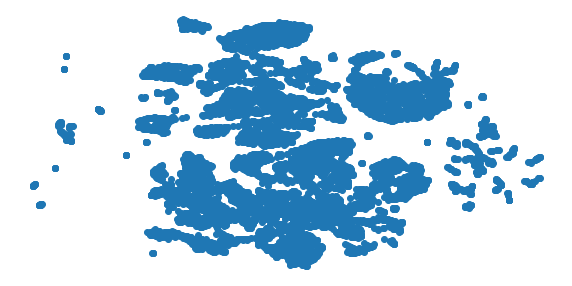

In [34]:
import umap

umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X)
plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 28 separate connected components using meta-embedding (experimental)
  n_components


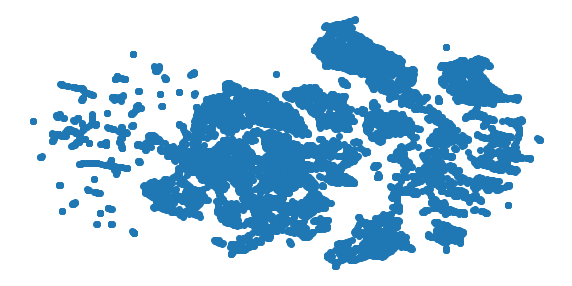

In [35]:
umap_results = umap.UMAP(n_neighbors=4,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X)
plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 97 separate connected components using meta-embedding (experimental)
  n_components


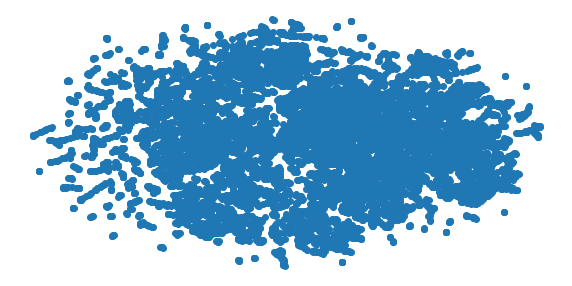

In [36]:
umap_results = umap.UMAP(n_neighbors=3,
                      min_dist=0.5,
                      metric='correlation').fit_transform(X)
plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [38]:
#Plot best separated UMAP with colored labels
plt.figure(figsize=(10,5))
colours = ["r","b"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], Y.iloc[i],
             color=colours[int(Y.iloc[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Based on initial results, the clusters do not seem linearly separable, therefore 2 hidden layers should be used. 

In [96]:
#Random layer size initialization
mlp=MLPClassifier(hidden_layer_sizes=(10, 10), max_iter=1000, tol=0.001)
mlp.fit(X, Y)
cross_val_score(mlp, X, Y, cv=5)

array([0.90945946, 0.88783784, 0.9027027 , 0.89770167, 0.90396754])

The first layer's optimal node range will be within the total number of inputs and outputs. This featureset has 28 features of input and 2 outputs(classification results)

In [100]:

layers = [(x, ) for x in range(10, 31, 2)]
param_grid = {'hidden_layer_sizes': layers}
mlp_search= GridSearchCV(MLPClassifier(max_iter=500, tol=0.001),
                         param_grid, n_jobs=-1, cv=5, return_train_score=True, verbose=True)
mlp_search.fit(X, Y)
print(mlp_search.best_params_, mlp_search.best_score_)

Fitting 5 folds for each of 11 candidates, totalling 55 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   21.2s
[Parallel(n_jobs=-1)]: Done  55 out of  55 | elapsed:   28.0s finished


{'hidden_layer_sizes': (24,)} 0.9010543390105434


Text(0.5, 1.0, 'Train and Testing Errors by # Nodes')

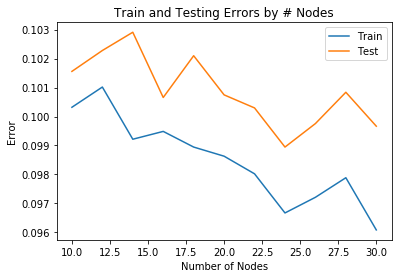

In [101]:
#Plot train/test results 

plt.plot(layers, 1-mlp_search.cv_results_['mean_train_score'], label='Train')
plt.plot(layers, 1-mlp_search.cv_results_['mean_test_score'], label='Test')

plt.ylabel('Error')
plt.xlabel('Number of Nodes')
plt.legend(loc='upper right')
plt.title('Train and Testing Errors by # Nodes')

The optimal number of nodes occurs when testing error reaches its minimum at 24 nodes.

In [102]:
layer2 = [(24, x) for x in range(2, 12)]
param_grid = {'hidden_layer_sizes': layer2}
mlp_search2= GridSearchCV(mlp, param_grid,n_jobs=-1, cv=5, return_train_score=True, verbose=True)
mlp_search2.fit(X, Y)
print(mlp_search2.best_params_, mlp_search2.best_score_)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   49.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   54.5s finished


{'hidden_layer_sizes': (24, 9)} 0.9024961701360729


In [105]:
#Tune MLP model
#Define which parameter options to tune
param_grid = {
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [p for p in range(5, 10)],
    'learning_rate': ['constant','adaptive'],
}
mlp_search3= GridSearchCV(MLPClassifier(
    hidden_layer_sizes=mlp_search2.best_params_['hidden_layer_sizes'], 
    max_iter=1000, tol=0.001),
                          param_grid, cv=5, n_jobs=-1, verbose=True
)
mlp_search3.fit(X, Y)
print(mlp_search3.best_params_, mlp_search3.best_score_)

Fitting 5 folds for each of 40 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:  5.5min finished


{'activation': 'tanh', 'alpha': 5, 'learning_rate': 'constant', 'solver': 'adam'} 0.889970262233036


In [125]:
param_grid = {'alpha': [10.0**p for p in range(-4, 1)]}
mlp_search4= GridSearchCV(MLPClassifier(
    mlp_search2.best_params_['hidden_layer_sizes'],
    mlp_search3.best_params_['activation'], 
    mlp_search3.best_params_['learning_rate'],
    mlp_search3.best_params_['solver']
),
    param_grid,n_jobs=-1, cv=5, return_train_score=True, verbose=True)
mlp_search4.fit(X, Y)
print(mlp_search4.best_params_, mlp_search4.best_score_)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
exception calling callback for <Future at 0x123325190 state=finished raised TerminatedWorkerError>
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/externals/loky/_base.py", line 625, in _invoke_callbacks
    callback(self)
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/parallel.py", line 309, in __call__
    self.parallel.dispatch_next()
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/parallel.py", line 731, in dispatch_next
    if not self.dispatch_one_batch(self._original_iterator):
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/parallel.py", line 759, in dispatch_one_batch
    self._dispatch(tasks)
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/paral

TerminatedWorkerError: A worker process managed by the executor was unexpectedly terminated. This could be caused by a segmentation fault while calling the function or by an excessive memory usage causing the Operating System to kill the worker. The exit codes of the workers are {SIGABRT(-6), SIGABRT(-6), SIGABRT(-6), SIGABRT(-6)}

In [130]:
mlp_tuned=MLPClassifier(hidden_layer_sizes=(24, 9), 
                        alpha= 0.00001,
                        activation= 'tanh',  
                        solver= 'adam',
                        learning_rate= 'constant',
                        max_iter=1000
                       )
mlp_tuned.fit(X, Y)
mlp_tuned.score(X, Y)

0.9240335225736686

In [133]:
cross_val_score(mlp_tuned, X, Y, cv=5)

array([0.9018018 , 0.89459459, 0.90675676, 0.89950428, 0.90757439])

# Model Evaluation

In [145]:
#Make dummy to replace bool variable
shop_test['Is_Weekend']=np.where(shop_test.Weekend==True, 1, 0)
shop_test=shop_test.drop('Weekend', 1)

In [146]:
#Preprocess test data usign same methods
numeric_test=shop_test.select_dtypes(include=['float64, int64'])
for col in numeric_test: 
    numeric_test.loc[:, col], _=boxcox(numeric_test.loc[:, col]+1)

In [147]:
#Feature Engineering
shop_test['Total_Duration']=shop_test['Administrative_Duration'] \
+shop_test['Informational_Duration']+shop_test['ProductRelated_Duration']
shop_test['Total_Duration'], _=boxcox(shop_test['Total_Duration']+1)
shop_test['Page_Visits']=shop_test.Administrative+shop_test.Informational+shop_test.ProductRelated
shop_test['Page_Visits'], _=boxcox(shop_test['Page_Visits']+1)

In [155]:
#Create features and target 
#Overwrite transformed numeric categories first
shop_test[numeric_test.columns]=numeric_test
X_test=shop_test.drop(['Revenue',], 1)
X_test=pd.get_dummies(X_test, drop_first=True)
X_test=MinMaxScaler().fit_transform(X_test)
Y_test=shop_test.Revenue

In [163]:
#Compare RFC results to neural network
Y_pred=rfc_tuned.predict(X_test)
rfc_tuned_matrix= confusion_matrix(Y_test, Y_pred)
print(rfc_tuned_matrix)
print('Classification Rate:{:.3f}'.format((rfc_tuned_matrix[0, 0]+rfc_tuned_matrix[1, 1])/X_test.shape[0]))
print('Recall Score for No Revenue:{:.3f}'.format(rfc_tuned_matrix[0, 0]/(rfc_tuned_matrix[0, 1]+ rfc_tuned_matrix[0, 0])))
print('Precision Score for No Revenue:{:.3f}'.format(rfc_tuned_matrix[0, 0]/(rfc_tuned_matrix[1, 0]+ rfc_tuned_matrix[0, 0])))
print('Recall Score for Positive Revenue:{:.3f}'.format(rfc_tuned_matrix[1, 1]/(rfc_tuned_matrix[1, 0]+ rfc_tuned_matrix[1, 1])))
print('Precision Score for Positive Revenue:{:.3f}'.format(rfc_tuned_matrix[1, 1]/(rfc_tuned_matrix[0, 1]+ rfc_tuned_matrix[1, 1])))

[[1042    0]
 [ 190    1]]
Classification Rate:0.846
Recall Score for No Revenue:1.000
Precision Score for No Revenue:0.846
Recall Score for Positive Revenue:0.005
Precision Score for Positive Revenue:1.000


In [169]:
mlp_tuned_matrix=confusion_matrix(Y_test, mlp_tuned.predict(X_test))
print(mlp_tuned_matrix)
print('Classification Rate:{:.3f}'.format((mlp_tuned_matrix[0, 0]+mlp_tuned_matrix[1, 1])/X.shape[0]))
print('Recall Score for No Revenue:{:.3f}'.format(mlp_tuned_matrix[0, 0]/(mlp_tuned_matrix[0, 1]+ mlp_tuned_matrix[0, 0])))
print('Precision Score for No Revenue:{:.3f}'.format(mlp_tuned_matrix[0, 0]/(mlp_tuned_matrix[1, 0]+ mlp_tuned_matrix[0, 0])))
print('Recall Score for Positive Revenue:{:.3f}'.format(mlp_tuned_matrix[1, 1]/(mlp_tuned_matrix[1, 0]+ mlp_tuned_matrix[1, 1])))
print('Precision Score for Positive Revenue:{:.3f}'.format(mlp_tuned_matrix[1, 1]/(mlp_tuned_matrix[0, 1]+ mlp_tuned_matrix[1, 1])))

[[1040    2]
 [ 172   19]]
Classification Rate:0.859
Recall Score for No Revenue:0.998
Precision Score for No Revenue:0.858
Recall Score for Positive Revenue:0.099
Precision Score for Positive Revenue:0.905


# Conclusion

The Random Forest Model performed much more efficiently on test data in this case, taking a  fraction of the training time to provide sufficient performance results. Additionally, the Feature Importance attribute lets us know which features are weighting the model. However, in terms of recall, the MLP model outperformed Random Forest on test data, correctly classifying 19 positive revenue instances to the Random Forest's one. 

The Feature Importances diagram indicates that the key features in identifying customers spending money are PageValues, BounceRates, ExitRates, Page Visits, and Total Duration. Therefore the most important action the business may take on this is prioritizing pageviews on the goal and transaction pages, as views on administrative and informational pages bore no correlation with revenue. 

Since ExitRates had more of a negative impact than BounceRates, this indicates the website is doing decently well at enticing a few clicks, but are losing out on that specific webpage, which will help pinpoint where the funnell is losing the most potential customers.

Although the neural net performed best on unseen data, the Random Forest is unparallelled in its ease of use, interpretability, and training time, making it an excellent starting point for any machine learning problems needing clear, actionable results. 